<a href="https://colab.research.google.com/github/ovieimara/ITNPAI1/blob/master/Computer_Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
%%capture output
!pip install ultralytics

In [ ]:
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
# Load the official pretrained YOLOv8n model
# model = YOLO('yolov8n.pt')
model = YOLO("yolo11n.pt")


100%|██████████| 5.35M/5.35M [00:00<00:00, 145MB/s]


Looking for image folders in: /content/vision/infer
Results will be saved in: /content/vision/infer/results
Loading YOLOv8 model...
Model loaded successfully.

Starting object detection...

Processing folder: refrigerator
  Found 2 images. Running detection...
    Processing IMG_2160.jpeg...
      Displaying result for IMG_2160.jpeg:


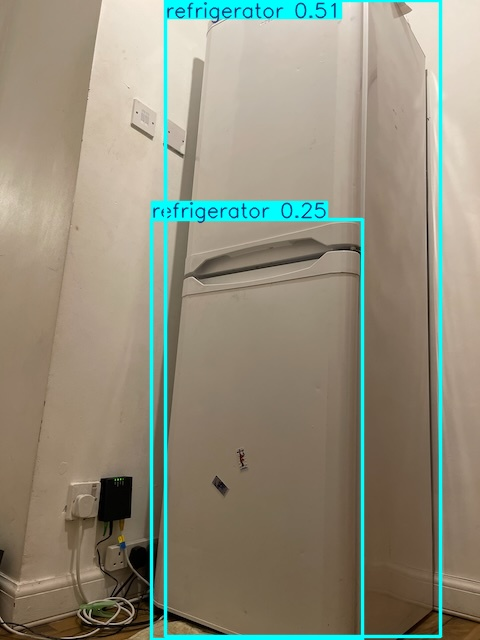

      Detected objects:
        - refrigerator (Confidence: 0.51)
        - refrigerator (Confidence: 0.25)
    Processing IMG_2167.jpeg...
      Displaying result for IMG_2167.jpeg:


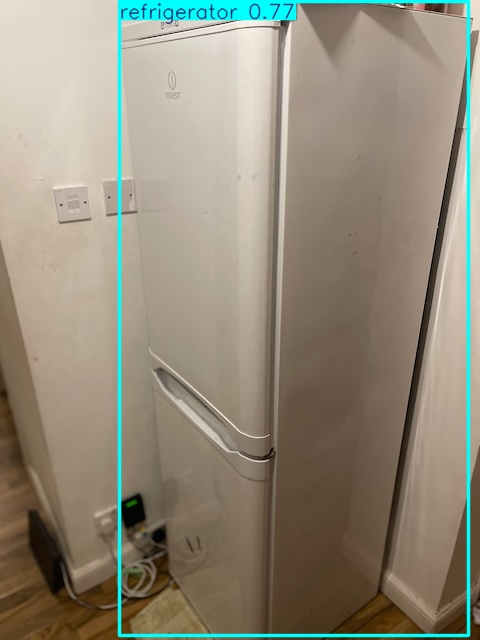

      Detected objects:
        - refrigerator (Confidence: 0.77)

Processing folder: washing_machine
  Found 1 images. Running detection...
    Processing wm1.jpg...
      Displaying result for wm1.jpg:


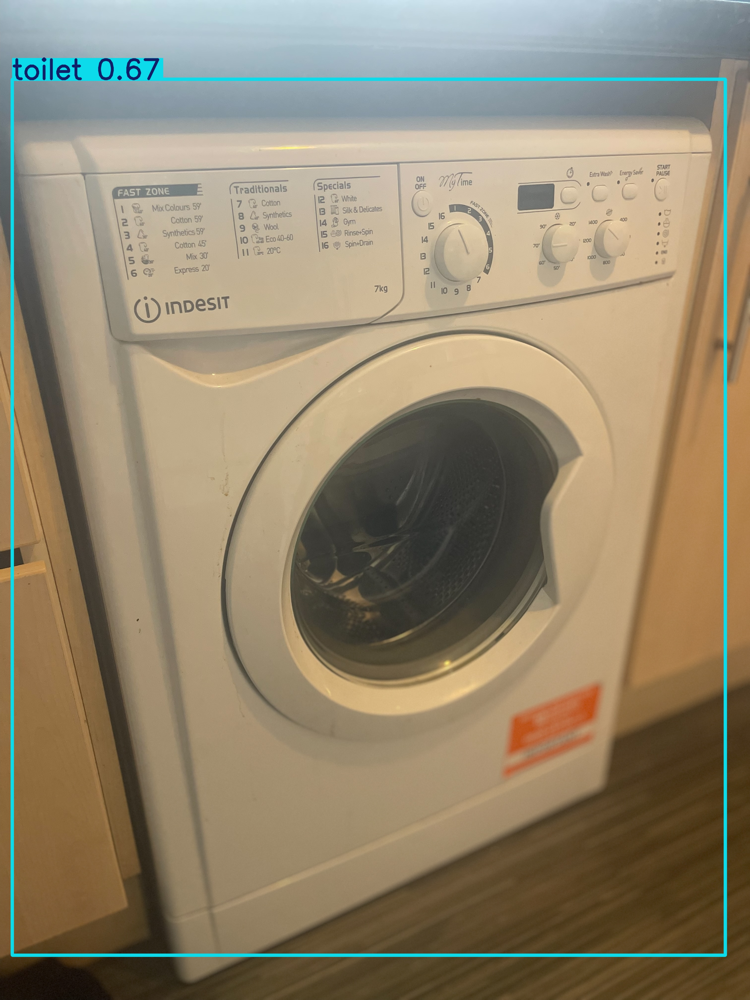

      Detected objects:
        - toilet (Confidence: 0.67)

Processing folder: pot

Processing folder: blender

Processing folder: microwave

Object detection complete.
Annotated images saved in respective subfolders under: /content/vision/infer/results


In [ ]:


# Step 2: Import necessary libraries
import os
import glob
from ultralytics import YOLO
from google.colab import files # Optional: For downloading results later
import cv2 # OpenCV for image handling (installed with ultralytics)
from google.colab.patches import cv2_imshow # To display images in Colab

# Step 3: Define folder paths and create results directory
# IMPORTANT: Update 'base_folder_path' if your folders are not directly under /content/
# For example, if using Google Drive: base_folder_path = '/content/drive/MyDrive/YourImageFolder/'
base_folder_path = '/content/vision/infer' # Assumes folders are directly in the root Colab environment

# List of folders containing your images
image_folders = ['refrigerator', 'washing_machine', 'pot', 'blender', 'microwave']

# Path for saving annotated images
results_base_path = os.path.join(base_folder_path, 'results')
os.makedirs(results_base_path, exist_ok=True) # Create the results directory if it doesn't exist

print(f"Looking for image folders in: {base_folder_path}")
print(f"Results will be saved in: {results_base_path}")

# Step 4: Load a pretrained YOLOv8 model
# You can choose different models like 'yolov8s.pt', 'yolov8m.pt', etc.
# 'yolov8n.pt' (nano) is the smallest and fastest.
print("Loading YOLOv11 model...")
# model = YOLO('yolov8n.pt')
print("Model loaded successfully.")

# Step 5: Process images in each folder
print("\nStarting object detection...")

for folder_name in image_folders:
    current_folder_path = os.path.join(base_folder_path, folder_name)
    results_folder_path = os.path.join(results_base_path, folder_name)
    os.makedirs(results_folder_path, exist_ok=True) # Create specific result folder

    print(f"\nProcessing folder: {folder_name}")

    if not os.path.isdir(current_folder_path):
        print(f"  WARNING: Folder not found: {current_folder_path}. Skipping.")
        continue

    # Find all image files (jpg, png, jpeg) in the current folder
    image_files = []
    for ext in ('*.jpg', '*.png', '*.jpeg'):
        image_files.extend(glob.glob(os.path.join(current_folder_path, ext)))

    if not image_files:
        print(f"  No images found in {current_folder_path}.")
        continue

    print(f"  Found {len(image_files)} images. Running detection...")

    # Run detection on each image in the folder
    for img_path in image_files:
        try:
            print(f"    Processing {os.path.basename(img_path)}...")
            # Perform inference
            results = model(img_path, verbose=False) # verbose=False reduces console output

            # Get the first result object (assuming one image processed at a time)
            result = results[0]

            # Define the output path for the annotated image
            output_filename = f"detected_{os.path.basename(img_path)}"
            output_path = os.path.join(results_folder_path, output_filename)

            # Save the image with bounding boxes
            result.save(filename=output_path)

            # Optional: Display the annotated image in Colab (can be slow for many images)
            print(f"      Displaying result for {os.path.basename(img_path)}:")
            annotated_img = cv2.imread(output_path)
            cv2_imshow(annotated_img) # Use cv2_imshow in Colab

            # Optional: Print detected objects and their confidence
            print("      Detected objects:")
            for box in result.boxes:
                class_id = int(box.cls[0])
                confidence = float(box.conf[0])
                class_name = model.names[class_id]
                print(f"        - {class_name} (Confidence: {confidence:.2f})")

        except Exception as e:
            print(f"    ERROR processing {os.path.basename(img_path)}: {e}")

print("\nObject detection complete.")
print(f"Annotated images saved in respective subfolders under: {results_base_path}")



In [ ]:
# Install Ultralytics
!pip install ultralytics -q

import os
from ultralytics import YOLO
import torch # PyTorch is needed, usually installed with ultralytics

# Check if GPU is available
print(f"GPU Available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"Current GPU: {torch.cuda.get_device_name(0)}")

# --- Configuration ---

# Path to your dataset configuration YAML file
# UPDATE THIS PATH if your yaml file is elsewhere
data_yaml_path = '/content/vision/vision.yaml'

# Choose the base model to fine-tune (start with a pretrained one)
# 'yolov8n.pt' (nano) is fastest, 'yolov8s.pt' (small) is a good balance,
# 'yolov8m.pt' (medium) is more accurate but slower/needs more memory.
# base_model = 'yolov8n.pt'
# base_model = model

# Training parameters
epochs = 50          # How many times to go through the entire training dataset (start small like 25-50)
image_size = 640     # Input image size (common for YOLOv8)
batch_size = 8      # How many images to process at once (reduce if Colab runs out of GPU memory, e.g., 8 or 4)
run_name = 'finetune_run1' # Name for this training run (results saved here)

# --- Load Model ---
print(f"Loading base model: {base_model}")
# Load a pretrained model (important for fine-tuning)
model = YOLO(base_model)
print("Model loaded.")

# --- Start Training ---
print("Starting fine-tuning...")
try:
    results = model.train(
        data=data_yaml_path,
        epochs=epochs,
        imgsz=image_size,
        batch=batch_size,
        name=run_name,
        augment=True,  # Explicitly enable augmentations
        # device=0 # Uncomment if you want to explicitly specify GPU 0
        # workers=8 # Adjust based on Colab resources
        # patience=10 # Optional: Stop training early if no improvement after N epochs
        # pretrained=True # Default is True when loading a .pt file
    )
    print("Training finished successfully!")
    print(f"Results saved to: runs/detect/{run_name}")

except Exception as e:
    print(f"An error occurred during training: {e}")



GPU Available: True
Current GPU: Tesla T4
Loading base model: yolov8n.pt
Model loaded.
Starting fine-tuning...
Ultralytics 8.3.113 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/vision/vision.yaml, epochs=50, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=finetune_run1, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=F

In [ ]:
# --- (Optional) Evaluate ---
# The best model is usually saved automatically during training.
# You can explicitly validate the best model found:
best_model_path = f"runs/detect/{run_name}2/weights/best.pt"
if os.path.exists(best_model_path):
    print("\nValidating the best model on the validation set...")
    model_best = YOLO(best_model_path)
    metrics = model_best.val() # Runs validation
    print("Validation Metrics:", metrics.box.map50) # Example: Print mAP50 score
else:
    print("\nCould not find best model weights to validate.")


Validating the best model on the validation set...
Ultralytics 8.3.109 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/vision/labels/val.cache... 29 images, 0 backgrounds, 0 corrupt: 100%|██████████| 29/29 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.62s/it]


                   all         29         29      0.962       0.94      0.991      0.817
               blender         14         14          1      0.905      0.995      0.813
                   pot         12         12      0.995      0.917      0.984      0.688
       washing_machine          3          3      0.889          1      0.995      0.951
Speed: 3.8ms preprocess, 11.7ms inference, 0.0ms loss, 4.7ms postprocess per image
Results saved to runs/detect/val
Validation Metrics: 0.9911904761904763


Running inference with fine-tuned model: runs/detect/finetune_run12/weights/best.pt

image 1/1 /content/IMG_2083_Medium.jpeg: 640x480 1 blender, 13.1ms
Speed: 2.1ms preprocess, 13.1ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 480)


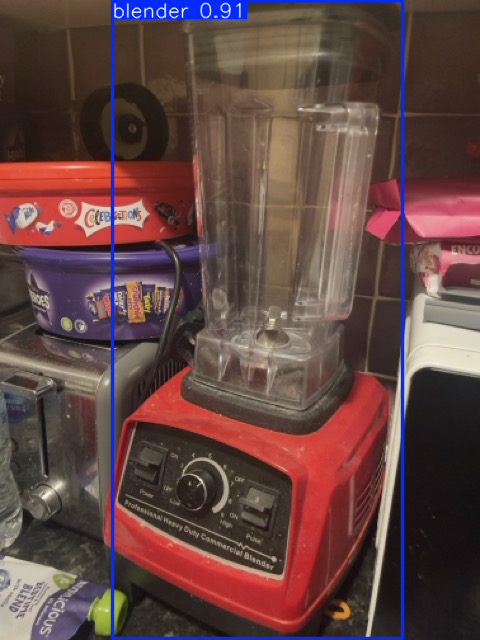

In [ ]:
from google.colab.patches import cv2_imshow

# UPDATE THIS PATH to your best model weights
fine_tuned_model_path = 'runs/detect/finetune_run12/weights/best.pt'

# Load your custom fine-tuned model
model = YOLO(fine_tuned_model_path)

# Path to an image you want to test
test_image_path = '/content/IMG_2083_Medium.jpeg' # Or any new image

print(f"Running inference with fine-tuned model: {fine_tuned_model_path}")
results = model(test_image_path)

# Process and show results (same as before)
annotated_image = results[0].plot() # plot() returns the annotated image array
cv2_imshow(annotated_image)

# Or save the result
# results[0].save(filename='fine_tuned_result.jpg')

In [ ]:
# Step 1: Install necessary libraries
# !pip install ultralytics scikit-learn -q

import os
import glob
import shutil # For copying files
import random
import yaml   # For handling YAML files
from sklearn.model_selection import KFold
from ultralytics import YOLO
import torch
import numpy as np

# --- Configuration ---

# --- 1.1 Data Preparation Paths ---
# Path to the directory containing ALL your images (before splitting)
all_images_dir = '/content/vision/images/'
# Path to the directory containing ALL corresponding labels (.txt files)
all_labels_dir = '/content/vision/labels/'
# Base directory where CV folds structure will be created
dataset_base_dir = '/content/vision/cv_dataset/'
# Base directory for saving training runs
runs_base_dir = '/content/vision/cv_runs/'

# --- 1.2 Dataset & Model Configuration ---
num_folds = 5
num_classes = 5 # UPDATE THIS
# class_names = ['blender', 'pot', 'washing_machine', 'Refrigerator', 'Microwave'] # UPDATE THIS
class_names = ["Blender", "Microwave", "Pot", "Refrigerator", "Washing Machine"]

base_model = 'yolo11n.pt' # Base model for each fold's training
# base_model = model # Base model for each fold's training

epochs_per_fold = 30     # Epochs for each fold (adjust as needed)
image_size = 640
batch_size = 16          # Reduce if OOM error
run_name_prefix = 'kitchen_cv_fold_' # Prefix for naming each fold's run

# --- Step 2: Prepare Data and Split into Folds ---

print("--- Step 2: Preparing Data and Splitting into Folds ---")

# Ensure base directories exist
os.makedirs(dataset_base_dir, exist_ok=True)
os.makedirs(runs_base_dir, exist_ok=True)

# Get list of all image files (assuming label files have the same base name)
all_image_files = sorted(glob.glob(os.path.join(all_images_dir, '*.jpeg'))) # Adjust extension if needed (.png, etc.)
# Ensure corresponding label files exist
all_label_files = [os.path.join(all_labels_dir, os.path.basename(f).replace('.jpeg', '.txt')) for f in all_image_files] # Adjust extension replacement

# Check if image and label counts match
if len(all_image_files) != len(all_label_files):
    print("ERROR: Number of images and labels doesn't match!")
    exit()

# Check if all expected label files actually exist
missing_labels = [lbl for lbl, img in zip(all_label_files, all_image_files) if not os.path.exists(lbl)]
if missing_labels:
    print(f"ERROR: Missing label files for {len(missing_labels)} images. Example: {missing_labels[0]}")
    exit()

print(f"Found {len(all_image_files)} total images and labels.")

# Initialize KFold
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42) # random_state for reproducible splits

# Store indices for each fold
fold_indices = list(kf.split(all_image_files))

print(f"Data split into {num_folds} folds.")

# --- Step 3: Loop Through Folds for Training ---

print("\n--- Step 3: Starting Cross-Validation Training ---")

fold_results = [] # To store validation metrics from each fold

for fold_num in range(num_folds):
    print(f"\n--- Processing Fold {fold_num + 1}/{num_folds} ---")

    train_indices, val_indices = fold_indices[fold_num]

    # --- 3.1 Create directory structure for the current fold ---
    fold_dir = os.path.join(dataset_base_dir, f'fold_{fold_num + 1}')
    fold_train_img_dir = os.path.join(fold_dir, 'images', 'train')
    fold_val_img_dir = os.path.join(fold_dir, 'images', 'val')
    fold_train_lbl_dir = os.path.join(fold_dir, 'labels', 'train')
    fold_val_lbl_dir = os.path.join(fold_dir, 'labels', 'val')

    # Remove existing fold directory if it exists, then create structure
    if os.path.exists(fold_dir):
        shutil.rmtree(fold_dir)
    os.makedirs(fold_train_img_dir)
    os.makedirs(fold_val_img_dir)
    os.makedirs(fold_train_lbl_dir)
    os.makedirs(fold_val_lbl_dir)

    # --- 3.2 Copy files into the fold's train/val directories ---
    print("  Copying training files...")
    for idx in train_indices:
        shutil.copy(all_image_files[idx], fold_train_img_dir)
        shutil.copy(all_label_files[idx], fold_train_lbl_dir)

    print("  Copying validation files...")
    for idx in val_indices:
        shutil.copy(all_image_files[idx], fold_val_img_dir)
        shutil.copy(all_label_files[idx], fold_val_lbl_dir)

    # --- 3.3 Create YAML configuration file for the current fold ---
    yaml_data = {
        'train': os.path.abspath(fold_train_img_dir), # Use absolute paths for safety
        'val': os.path.abspath(fold_val_img_dir),
        'nc': num_classes,
        'names': class_names
    }
    yaml_file_path = os.path.join(fold_dir, f'data_fold_{fold_num + 1}.yaml')
    with open(yaml_file_path, 'w') as f:
        yaml.dump(yaml_data, f, default_flow_style=False)
    print(f"  Created YAML config: {yaml_file_path}")

    # --- 3.4 Load the BASE pretrained model (important!) ---
    print(f"  Loading base model: {base_model}")
    model = YOLO(base_model)

    # --- 3.5 Train the model for the current fold ---
    fold_run_name = f"{run_name_prefix}{fold_num + 1}"
    print(f"  Starting training for fold {fold_num + 1} with data augmentation...")
    try:
        results = model.train(
            # --- Core Training Params ---
            data=yaml_file_path,
            epochs=epochs_per_fold,
            imgsz=image_size,
            batch=batch_size,
            name=fold_run_name,
            project=runs_base_dir, # Save runs in a specific base directory
            exist_ok=True, # Allow overwriting if run name exists

            # --- Data Augmentation Params ---
            degrees=10.0,      # image rotation (+/- deg)
            translate=0.1,     # image translation (+/- fraction)
            scale=0.2,         # image scale (+/- gain)
            shear=5.0,         # image shear (+/- deg)
            perspective=0.0,   # image perspective (+/- fraction), range 0-0.001
            flipud=0.0,        # image flip up-down (probability)
            fliplr=0.5,        # image flip left-right (probability)
            mosaic=1.0,        # mosaic augmentation (probability)
            mixup=0.0,         # mixup augmentation (probability)
            copy_paste=0.0,    # copy-paste augmentation (probability)
            hsv_h=0.015,       # image HSV-Hue augmentation (fraction)
            hsv_s=0.7,         # image HSV-Saturation augmentation (fraction)
            hsv_v=0.4,         # image HSV-Value augmentation (fraction)
            # device=0 # Specify GPU
        )
        print(f"  Training for fold {fold_num + 1} finished.")

        # --- 3.6 Store validation results ---
        map50_95 = results.box.map # mAP50-95
        map50 = results.box.map50  # mAP50
        # Store the path to the best weights for this fold as well
        best_weights_path = results.save_dir / 'weights' / 'best.pt' # Path object
        fold_results.append({
            'fold': fold_num + 1,
            'map50-95': map50_95,
            'map50': map50,
            'run_name': fold_run_name,
            'best_weights': str(best_weights_path) # Convert Path to string
         })
        print(f"  Fold {fold_num + 1} Validation Results: mAP50-95={map50_95:.4f}, mAP50={map50:.4f}")
        print(f"  Best weights saved to: {best_weights_path}")

    except Exception as e:
        print(f"  ERROR during training/validation for fold {fold_num + 1}: {e}")
        # Record failure but maybe without weights path
        fold_results.append({
             'fold': fold_num + 1,
             'map50-95': None, # Indicate failure
             'map50': None,
             'run_name': fold_run_name,
             'best_weights': None
        })

# --- Step 4: Aggregate Results and Find Best Model ---

print("\n--- Step 4: Cross-Validation Results & Best Model Identification ---")

best_fold_info = None # To store info about the best performing fold

if fold_results:
    # Filter out potential None values if a fold failed catastrophically
    valid_results = [r for r in fold_results if r['map50'] is not None] # Check map50 for validity

    if valid_results:
        avg_map50_95 = np.mean([r['map50-95'] for r in valid_results])
        std_map50_95 = np.std([r['map50-95'] for r in valid_results])
        avg_map50 = np.mean([r['map50'] for r in valid_results])
        std_map50 = np.std([r['map50'] for r in valid_results])

        print("\nIndividual Fold Results:")
        for r in fold_results: # Print all attempts
            map50_95_str = f"{r['map50-95']:.4f}" if r['map50-95'] is not None else "N/A (Error)"
            map50_str = f"{r['map50']:.4f}" if r['map50'] is not None else "N/A (Error)"
            weights_str = r['best_weights'] if r['best_weights'] else "N/A (Error)"
            print(f"  Fold {r['fold']}: mAP50-95 = {map50_95_str}, mAP50 = {map50_str}, Weights = {weights_str}")

        print(f"\nAverage mAP50-95 across {len(valid_results)} successful folds: {avg_map50_95:.4f} (+/- {std_map50_95:.4f})")
        print(f"Average mAP50 across {len(valid_results)} successful folds: {avg_map50:.4f} (+/- {std_map50:.4f})")

        # --- Find the best fold based on mAP50 score ---
        best_fold_info = max(valid_results, key=lambda x: x['map50'])
        print(f"\nBest performing fold based on mAP50: Fold {best_fold_info['fold']}")
        print(f"  mAP50: {best_fold_info['map50']:.4f}")
        print(f"  Best weights path: {best_fold_info['best_weights']}")

    else:
        print("No successful fold results collected.")
else:
    print("No results collected from the folds.")


# --- Step 5: Using the Best Model from Cross-Validation for Inference ---
print("\n--- Step 5: Inference using Best Model from CV ---")

if best_fold_info and best_fold_info['best_weights'] and os.path.exists(best_fold_info['best_weights']):
    print(f"Loading the best model from Fold {best_fold_info['fold']}...")
    # Load the specific best.pt file identified from the best fold
    best_model = YOLO(best_fold_info['best_weights'])
    print("Best model loaded successfully.")

    # --- Run inference on a test image ---
    # IMPORTANT: Use an image NOT used in ANY training or validation fold for a true test
    # Or use one of the validation images from the best fold just to demonstrate
    # Let's find a validation image from the best fold to demonstrate
    best_fold_num = best_fold_info['fold']
    best_fold_val_img_dir = os.path.join(dataset_base_dir, f'fold_{best_fold_num}', 'images', 'val')
    test_image_list = glob.glob(os.path.join(best_fold_val_img_dir, '*.jpg')) # Adjust extension if needed

    if test_image_list:
        test_image_path = random.choice(test_image_list) # Pick a random validation image from the best fold
        print(f"\nRunning inference on test image: {test_image_path}")

        try:
            inference_results = best_model(test_image_path)

            # Display the results in Colab
            annotated_image = inference_results[0].plot() # plot() returns the annotated image array
            print("Displaying inference result:")
            cv2_imshow(annotated_image)

            # You can also save the result:
            # output_inference_path = f"/content/inference_result_fold{best_fold_num}.jpg"
            # inference_results[0].save(filename=output_inference_path)
            # print(f"Inference result saved to {output_inference_path}")

        except Exception as e:
            print(f"Error during inference: {e}")
    else:
        print(f"Could not find any validation images in {best_fold_val_img_dir} to run inference demonstration.")

else:
    print("\nCould not identify the best model or find its weights file.")
    print("Cannot run inference. Please check the training logs and file paths.")

# --- Alternative Next Step ---
print("\n--- Alternative Next Step ---")
print("Alternatively, after finding good hyperparameters from CV,")
print("you could re-train a single model on ALL your data using those settings.")


--- Step 2: Preparing Data and Splitting into Folds ---
Found 268 total images and labels.
Data split into 5 folds.

--- Step 3: Starting Cross-Validation Training ---

--- Processing Fold 1/5 ---
  Copying training files...
  Copying validation files...
  Created YAML config: /content/vision/cv_dataset/fold_1/data_fold_1.yaml
  Loading base model: yolo11n.pt
  Starting training for fold 1 with data augmentation...
Ultralytics 8.3.113 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/vision/cv_dataset/fold_1/data_fold_1.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/vision/cv_runs/, name=kitchen_cv_fold_1, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False,

train: Scanning /content/vision/cv_dataset/fold_1/labels/train... 214 images, 0 backgrounds, 0 corrupt: 100%|██████████| 214/214 [00:00<00:00, 1647.56it/s]

train: New cache created: /content/vision/cv_dataset/fold_1/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2036.5±1683.6 MB/s, size: 1508.9 KB)


val: Scanning /content/vision/cv_dataset/fold_1/labels/val... 54 images, 0 backgrounds, 0 corrupt: 100%|██████████| 54/54 [00:00<00:00, 640.83it/s]

val: New cache created: /content/vision/cv_dataset/fold_1/labels/val.cache


Plotting labels to /content/vision/cv_runs/kitchen_cv_fold_1/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/vision/cv_runs/kitchen_cv_fold_1
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      2.37G      1.512       3.52      2.043         18        640: 100%|██████████| 14/14 [00:16<00:00,  1.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.32it/s]

                   all         54         58    0.00789      0.693      0.305       0.15



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      2.77G      1.175      3.283      1.743         17        640: 100%|██████████| 14/14 [00:10<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.91it/s]

                   all         54         58     0.0155      0.826      0.437       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      2.79G      1.175      3.081      1.719         19        640: 100%|██████████| 14/14 [00:12<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]

                   all         54         58    0.00872      0.903      0.501      0.289



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30       2.8G      1.198      2.664      1.735         17        640: 100%|██████████| 14/14 [00:11<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.02it/s]

                   all         54         58    0.00556      0.905      0.541      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      2.82G      1.189      2.236      1.725         20        640: 100%|██████████| 14/14 [00:10<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.40it/s]

                   all         54         58      0.783      0.191      0.371      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      2.83G      1.284      2.025      1.781         16        640: 100%|██████████| 14/14 [00:10<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.78it/s]

                   all         54         58      0.513       0.35      0.432      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      2.85G      1.208       1.88       1.71         23        640: 100%|██████████| 14/14 [00:09<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.71it/s]

                   all         54         58      0.553      0.509      0.516      0.246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      2.86G      1.235      1.731      1.708         17        640: 100%|██████████| 14/14 [00:10<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.52it/s]

                   all         54         58      0.498       0.51       0.52      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      2.88G      1.163       1.66      1.669         19        640: 100%|██████████| 14/14 [00:11<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.55it/s]

                   all         54         58      0.611       0.59      0.646      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      2.89G      1.144      1.559      1.684         16        640: 100%|██████████| 14/14 [00:10<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]

                   all         54         58      0.916      0.534      0.731      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      2.91G      1.151      1.494      1.647         16        640: 100%|██████████| 14/14 [00:10<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.90it/s]

                   all         54         58      0.589      0.731      0.794      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      2.92G      1.171      1.518      1.677         13        640: 100%|██████████| 14/14 [00:10<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.15it/s]

                   all         54         58      0.762      0.656      0.711      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      2.94G      1.218      1.512      1.684         16        640: 100%|██████████| 14/14 [00:10<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.48it/s]

                   all         54         58      0.863      0.718      0.816      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      2.95G      1.161      1.443      1.631         16        640: 100%|██████████| 14/14 [00:11<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.20it/s]

                   all         54         58       0.92      0.833      0.884      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      2.97G      1.091      1.336      1.603         18        640: 100%|██████████| 14/14 [00:09<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.37it/s]

                   all         54         58       0.88      0.736      0.822      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      2.98G      1.095       1.29      1.584         22        640: 100%|██████████| 14/14 [00:09<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.45it/s]

                   all         54         58       0.86      0.785      0.823        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30         3G      1.072      1.303      1.562         19        640: 100%|██████████| 14/14 [00:12<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.11it/s]

                   all         54         58      0.896      0.832      0.873      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      3.01G      1.027      1.208      1.558         14        640: 100%|██████████| 14/14 [00:10<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]

                   all         54         58       0.85      0.868      0.873      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      3.02G      1.099      1.217      1.598         17        640: 100%|██████████| 14/14 [00:10<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  2.00it/s]

                   all         54         58      0.931      0.846      0.899      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      3.04G      1.045      1.189      1.537         19        640: 100%|██████████| 14/14 [00:10<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.39it/s]

                   all         54         58      0.919      0.898      0.898      0.596


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      3.05G     0.9874      1.782      1.717          6        640: 100%|██████████| 14/14 [00:17<00:00,  1.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]

                   all         54         58      0.888       0.85      0.847      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      3.07G      0.909      1.566      1.659          6        640: 100%|██████████| 14/14 [00:11<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.18it/s]

                   all         54         58      0.929      0.888      0.901      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      3.08G     0.8946      1.437      1.641          6        640: 100%|██████████| 14/14 [00:10<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.70it/s]

                   all         54         58        0.9      0.907      0.893      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30       3.1G     0.8409      1.381      1.591          6        640: 100%|██████████| 14/14 [00:10<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.29it/s]

                   all         54         58      0.962      0.894      0.908      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      3.11G     0.8137      1.358      1.542          7        640: 100%|██████████| 14/14 [00:11<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.53it/s]

                   all         54         58      0.963      0.894      0.909      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      3.13G     0.7955      1.282      1.515          6        640: 100%|██████████| 14/14 [00:11<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.30it/s]

                   all         54         58      0.926      0.904      0.912      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      3.14G      0.776      1.264      1.496          6        640: 100%|██████████| 14/14 [00:10<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.57it/s]

                   all         54         58      0.947      0.896      0.914      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      3.16G     0.7408      1.212      1.453          6        640: 100%|██████████| 14/14 [00:11<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.28it/s]

                   all         54         58       0.95      0.895      0.913      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      3.17G     0.7385      1.166      1.457          6        640: 100%|██████████| 14/14 [00:10<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]

                   all         54         58      0.958      0.892      0.911      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      3.19G     0.7122      1.163       1.41          6        640: 100%|██████████| 14/14 [00:09<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.41it/s]

                   all         54         58      0.951      0.892      0.911      0.619



30 epochs completed in 0.110 hours.
Optimizer stripped from /content/vision/cv_runs/kitchen_cv_fold_1/weights/last.pt, 5.5MB
Optimizer stripped from /content/vision/cv_runs/kitchen_cv_fold_1/weights/best.pt, 5.5MB

Validating /content/vision/cv_runs/kitchen_cv_fold_1/weights/best.pt...
Ultralytics 8.3.113 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,583,127 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]


                   all         54         58      0.928      0.903      0.912      0.655
               Blender         10         10      0.939          1      0.995      0.788
             Microwave         10         13      0.797      0.692      0.721      0.511
                   Pot         18         18          1      0.966      0.995      0.627
          Refrigerator         10         10          1      0.997      0.995      0.686
       Washing Machine          6          7      0.906      0.857      0.855      0.665
Speed: 0.2ms preprocess, 3.0ms inference, 0.0ms loss, 3.7ms postprocess per image
Results saved to /content/vision/cv_runs/kitchen_cv_fold_1
  Training for fold 1 finished.
  Fold 1 Validation Results: mAP50-95=0.6553, mAP50=0.9122
  Best weights saved to: /content/vision/cv_runs/kitchen_cv_fold_1/weights/best.pt

--- Processing Fold 2/5 ---
  Copying training files...
  Copying validation files...
  Created YAML config: /content/vision/cv_dataset/fold_2/data_fo

train: Scanning /content/vision/cv_dataset/fold_2/labels/train... 214 images, 0 backgrounds, 0 corrupt: 100%|██████████| 214/214 [00:00<00:00, 1477.35it/s]

train: New cache created: /content/vision/cv_dataset/fold_2/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1716.9±1764.1 MB/s, size: 2922.6 KB)


val: Scanning /content/vision/cv_dataset/fold_2/labels/val... 54 images, 0 backgrounds, 0 corrupt: 100%|██████████| 54/54 [00:00<00:00, 639.76it/s]

val: New cache created: /content/vision/cv_dataset/fold_2/labels/val.cache


Plotting labels to /content/vision/cv_runs/kitchen_cv_fold_2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/vision/cv_runs/kitchen_cv_fold_2
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      2.48G       1.45      3.508      1.969         17        640: 100%|██████████| 14/14 [00:15<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.35it/s]

                   all         54         54    0.00224      0.613      0.376      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      2.86G      1.155      3.296      1.724         15        640: 100%|██████████| 14/14 [00:11<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.44it/s]

                   all         54         54    0.00886      0.973      0.431      0.269



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      2.86G      1.149      3.042      1.679         19        640: 100%|██████████| 14/14 [00:11<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.44it/s]

                   all         54         54    0.00789          1      0.547      0.255



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      2.86G      1.208      2.718      1.757         17        640: 100%|██████████| 14/14 [00:10<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.49it/s]

                   all         54         54    0.00455      0.987      0.397      0.181



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      2.86G      1.254      2.396      1.775         19        640: 100%|██████████| 14/14 [00:11<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]

                   all         54         54      0.502      0.112       0.34      0.181



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      2.86G      1.291      2.128      1.795         18        640: 100%|██████████| 14/14 [00:09<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.84it/s]

                   all         54         54      0.861      0.192      0.236        0.1



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      2.86G      1.248      1.943      1.784         15        640: 100%|██████████| 14/14 [00:09<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.21it/s]

                   all         54         54       0.59      0.145      0.192      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      2.86G      1.232       1.79      1.749         15        640: 100%|██████████| 14/14 [00:09<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.57it/s]

                   all         54         54      0.455      0.634      0.651      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      2.86G        1.2        1.7       1.72         19        640: 100%|██████████| 14/14 [00:10<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.45it/s]

                   all         54         54      0.774      0.623      0.772      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      2.86G      1.223      1.663      1.708         15        640: 100%|██████████| 14/14 [00:10<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.43it/s]

                   all         54         54       0.76      0.803      0.836      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      2.86G      1.134      1.533       1.63         43        640:  64%|██████▍   | 9/14 [00:06<00:03,  1.28it/s]


--- Step 5: Inference using Best Model from CV ---
Loading the best model from Fold 2...
Best model loaded successfully.

Running inference on test image: /content/vision/test/IMG_2095.jpeg

image 1/1 /content/vision/test/IMG_2095.jpeg: 640x480 1 Refrigerator, 8.1ms
Speed: 1.3ms preprocess, 8.1ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 480)
Displaying inference result:


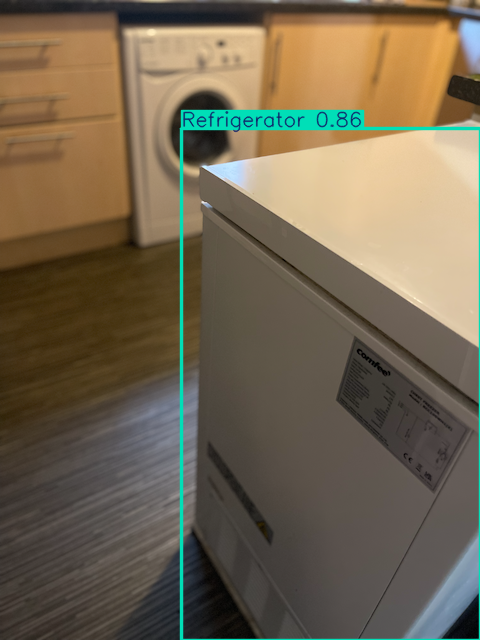


--- Alternative Next Step ---
Alternatively, after finding good hyperparameters from CV,
you could re-train a single model on ALL your data using those settings.


In [ ]:
# --- Step 5: Using the Best Model from Cross-Validation for Inference ---
from google.colab.patches import cv2_imshow

print("\n--- Step 5: Inference using Best Model from CV ---")

if best_fold_info and best_fold_info['best_weights'] and os.path.exists(best_fold_info['best_weights']):
    print(f"Loading the best model from Fold {best_fold_info['fold']}...")
    # Load the specific best.pt file identified from the best fold
    best_model = YOLO(best_fold_info['best_weights'])
    print("Best model loaded successfully.")

    # --- Run inference on a test image ---
    # IMPORTANT: Use an image NOT used in ANY training or validation fold for a true test
    # Or use one of the validation images from the best fold just to demonstrate
    # Let's find a validation image from the best fold to demonstrate
    best_fold_num = best_fold_info['fold']
    # best_fold_val_img_dir = os.path.join(dataset_base_dir, f'fold_{best_fold_num}', 'images', 'val')
    best_fold_val_img_dir = os.path.join('/content/vision', 'test')
    test_image_list = glob.glob(os.path.join(best_fold_val_img_dir, '*.jpeg')) # Adjust extension if needed

    if test_image_list:
        test_image_path = random.choice(test_image_list) # Pick a random validation image from the best fold
        print(f"\nRunning inference on test image: {test_image_path}")

        try:
            inference_results = best_model(test_image_path)

            # Display the results in Colab
            annotated_image = inference_results[0].plot() # plot() returns the annotated image array
            print("Displaying inference result:")
            cv2_imshow(annotated_image)

            # You can also save the result:
            # output_inference_path = f"/content/inference_result_fold{best_fold_num}.jpg"
            # inference_results[0].save(filename=output_inference_path)
            # print(f"Inference result saved to {output_inference_path}")

        except Exception as e:
            print(f"Error during inference: {e}")
    else:
        print(f"Could not find any validation images in {best_fold_val_img_dir} to run inference demonstration.")

else:
    print("\nCould not identify the best model or find its weights file.")
    print("Cannot run inference. Please check the training logs and file paths.")

# --- Alternative Next Step ---
print("\n--- Alternative Next Step ---")
print("Alternatively, after finding good hyperparameters from CV,")
print("you could re-train a single model on ALL your data using those settings.")